<a href="https://colab.research.google.com/github/yukti845/Dog-breed-identification-project/blob/master/Tensorflow_Learn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data 

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them). 


### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print('TF version : ', tf.__version__)
print('TF Hub version : ', hub.__version__)

TF version :  2.2.0
TF Hub version :  0.8.0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
labels_csv = pd.read_csv('/content/drive/My Drive/data/labels.csv')
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,42404238339c427c0fb830da89885d5e,scottish_deerhound
freq,1,126


In [ ]:
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

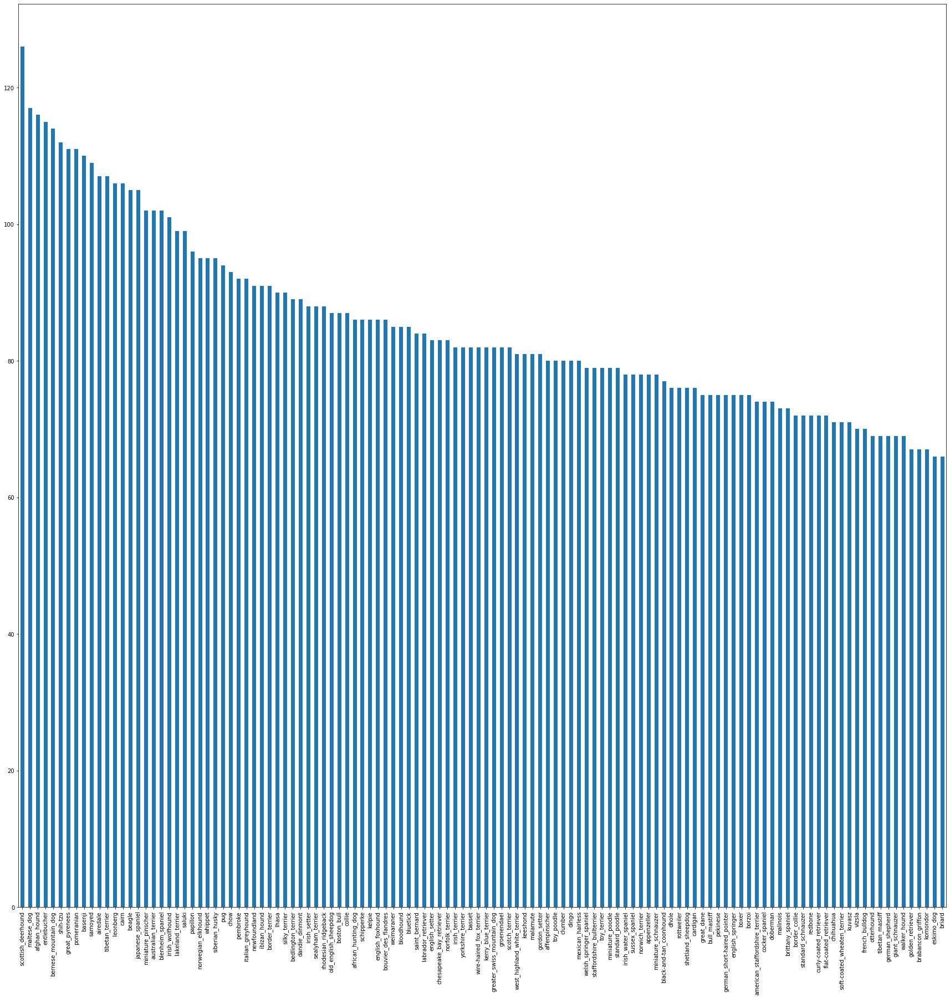

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(30,30))

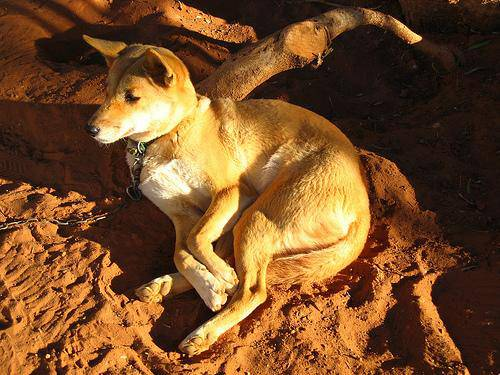

In [ ]:
from IPython.display import Image
Image('drive/My Drive/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels 

Let's get a list of all of our image file pathnames.

In [ ]:
filenames = ['drive/My Drive/data/train/'+fname+ '.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/My Drive/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

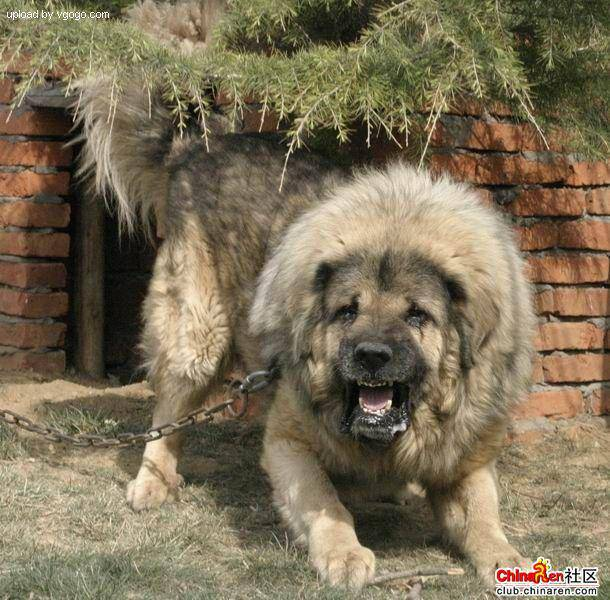

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [ ]:
import os
if len(os.listdir('drive/My Drive/data/train/')) == len(filenames):
  print('Filenames match actual amount of Files!!!! Proceed.')
else:
  print('Filenames do not match actual data!! Check the target directory..')

Filenames match actual amount of Files!!!! Proceed.


In [ ]:
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/My Drive/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
x = filenames
y = boolean_labels

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
NUM_IMAGES = 1000 #@param{type:'slider', min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES], y[:NUM_IMAGES],
                                                     test_size = 0.2, random_state = 9)
len(x_train), len(x_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:2],y_train[:2]

(['drive/My Drive/data/train/182c436dd1fbec1c5f4979077ce74659.jpg',
  'drive/My Drive/data/train/145f7bb3bf6e4877b8b6624f612a1c24.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False,  True, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[2])
image.shape

(375, 500, 3)

In [ ]:
image[:2]

array([[[ 97,  96,  91],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 10,  12,  11],
        [ 10,  12,  11],
        [ 10,  12,  11]],

       [[ 99,  98,  93],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 18,  20,  19],
        [ 18,  20,  19],
        [ 18,  20,  19]]], dtype=uint8)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 97,  96,  91],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 10,  12,  11],
        [ 10,  12,  11],
        [ 10,  12,  11]],

       [[ 99,  98,  93],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 18,  20,  19],
        [ 18,  20,  19],
        [ 18,  20,  19]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor. 
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image,size = [img_size, img_size])
  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: 
`(image, label)`.

In [ ]:
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image,label

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
BATCH_SIZE = 32

def create_data_batches(x , y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  if test_data:
    print('Creating test data batches........')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  
  elif valid_data:
    print('Creating valid data batches...........')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  
  else:
    print('Creating training data batches...............')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data = data.shuffle(buffer_size = len(x))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

In [ ]:
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val, valid_data=True)

Creating training data batches...............
Creating valid data batches...........


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

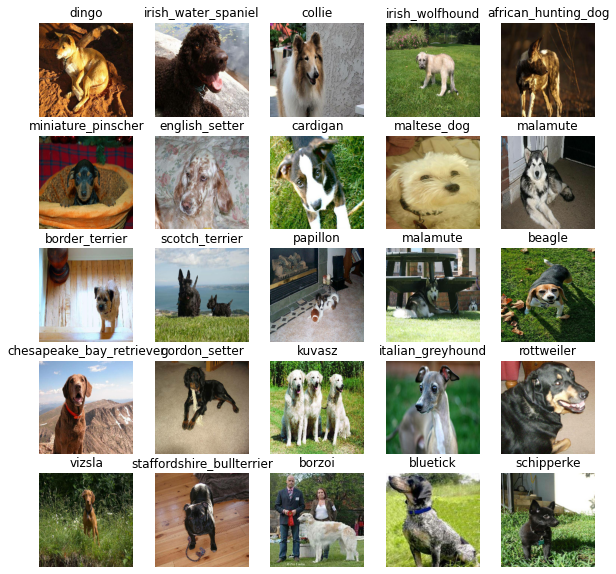

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

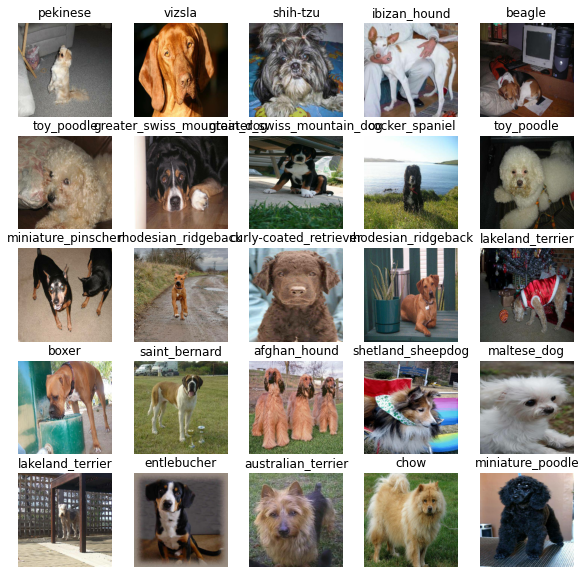

In [ ]:
valid_images, valid_labels = next(val_data.as_numpy_iterator())
show_25_images(valid_images,valid_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
INPUT_SHAPE = [None,224,224,3]

OUTPUT_SHAPE = len(unique_breeds)

MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
def create_models(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):

  """
  Trains a given model and returns the trained version.
  """

  print('Building a model with :',model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
                               hub.KerasLayer(model_url), #input layer
                               tf.keras.layers.Dense(units = output_shape,
                                                     activation = 'softmax') #output layer
  ])
  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(input_shape)
  
  return model

In [ ]:
model = create_models()

Building a model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension. 
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join('drive/My Drive/data/logs',
                         datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy', patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCH = 100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
def train_model():
  model = create_models()

  tensorboard = create_tensorboard_callback()

  model.fit(x = train_data, epochs = NUM_EPOCH,
            validation_data = val_data, validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  
  return model

In [ ]:
model = train_model()

Building a model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 101s 4s/step - loss: 4.5535 - accuracy: 0.0962 - val_loss: 3.2898 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 4s 167ms/step - loss: 1.6057 - accuracy: 0.6900 - val_loss: 2.0725 - val_accuracy: 0.5300
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.5555 - accuracy: 0.9337 - val_loss: 1.6145 - val_accuracy: 0.6250
Epoch 4/100
25/25 [==============================] - 4s 171ms/step - loss: 0.2375 - accuracy: 0.9937 - val_loss: 1.4645 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1398 - accuracy: 1.0000 - val_loss: 1.4132 - val_accuracy: 0.6750
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.0952 - accuracy: 1.0000 - val_loss: 1.3661 - val_accuracy: 0.6900
Epoch 7/100
25/25 [============================

 ### Checking the TensorBoard logs

 The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dataset\ Data\ Science/dog-breed-identification/logs

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:

# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 97ms/step


array([[5.5973479e-03, 1.4565713e-03, 4.5301669e-05, ..., 3.1060557e-04,
        2.1960233e-05, 2.3993626e-02],
       [4.4656746e-05, 2.6598154e-04, 4.3679513e-05, ..., 5.3633825e-04,
        5.9197744e-04, 2.9446636e-03],
       [4.9524494e-03, 3.0492959e-04, 6.7767789e-05, ..., 3.1196691e-05,
        2.4128312e-04, 7.3985936e-04],
       ...,
       [8.9704022e-03, 2.6609121e-05, 2.8502698e-05, ..., 9.8485081e-03,
        4.2687534e-04, 7.0733219e-01],
       [8.6796819e-04, 2.3794580e-04, 6.8012669e-05, ..., 1.8329223e-05,
        1.5900994e-04, 1.0323916e-03],
       [4.3009950e-06, 3.8543649e-06, 5.4187021e-05, ..., 1.2924451e-06,
        1.6444740e-06, 1.3698933e-04]], dtype=float32)

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.59734786e-03 1.45657128e-03 4.53016692e-05 2.35203588e-05
 3.71539762e-04 2.52214886e-05 4.47879225e-04 2.19848356e-04
 1.56659866e-04 3.96157120e-05 1.49923271e-05 1.90541905e-03
 3.16844555e-04 2.36061811e-02 3.42103476e-06 1.87734200e-04
 2.28080986e-04 1.59519748e-03 2.28213157e-05 2.38857057e-04
 1.46081686e-04 4.47134458e-04 1.54229900e-04 6.83874357e-04
 2.54157989e-04 2.46620784e-05 2.74445891e-04 5.42715097e-05
 9.06267542e-06 1.07237641e-02 4.37171693e-04 1.23785355e-03
 3.94955687e-02 1.22785626e-03 4.46319900e-04 4.38408554e-03
 1.21837184e-06 1.06745378e-04 1.47419647e-04 1.86701418e-05
 8.87568283e-04 1.80630668e-05 1.77236987e-04 1.11156460e-05
 2.95464024e-02 4.78276124e-05 1.15702987e-05 2.83268077e-04
 6.29582428e-06 4.11271751e-01 2.11445840e-05 9.91906636e-05
 3.42838317e-02 1.22003337e-06 1.06374457e-04 6.90267427e-07
 3.02552385e-03 3.94107192e-05 5.30559555e-06 5.85329326e-05
 8.22023139e-05 4.26550489e-03 4.10846580e-04 4.60849151e-06
 3.69208865e-04 7.849990

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'golden_retriever'

Since, our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

Let's make a function to do so.

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and 
  returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data 
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.3918853 , 0.3918853 , 0.36051273],
         [0.43775532, 0.43775532, 0.40638277],
         [0.44351017, 0.44351017, 0.41213763],
         ...,
         [0.05796662, 0.02239764, 0.01937653],
         [0.05252095, 0.0470589 , 0.04978992],
         [0.04586835, 0.05371149, 0.04978992]],
 
        [[0.38653433, 0.38261276, 0.3630049 ],
         [0.4161569 , 0.41223532, 0.39262748],
         [0.43315482, 0.42923325, 0.4096254 ],
         ...,
         [0.0909924 , 0.05177672, 0.04754004],
         [0.03035708, 0.02489503, 0.02762605],
         [0.02370449, 0.03154762, 0.02762605]],
 
        [[0.36859885, 0.36467728, 0.34506944],
         [0.35422263, 0.35030106, 0.33069322],
         [0.39899355, 0.39507198, 0.3754641 ],
         ...,
         [0.2361781 , 0.20233706, 0.19541305],
         [0.04896353, 0.04268564, 0.04582458],
         [0.04459034, 0.04705883, 0.04582458]],
 
        ...,
 
        [[0.7591447 , 0.75522316, 0.7356153 ],
         [0.74550796, 0.7415864 , 0.72197

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Let's make some functions to make these all a bit more visual

The first function we'll create will:
* Take an array of prediction probabilities, an array of truth labels, an array of images and labels.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

    plt.title("{}, {:2.0f}% ({})".format(pred_label,
                                         np.max(pred_prob)*100,
                                         true_label),
              color=color)

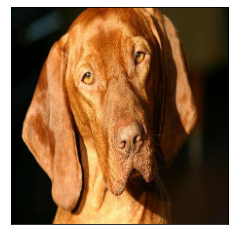

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities = predictions,
          labels = val_labels,
          images=val_images)

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # Change the color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


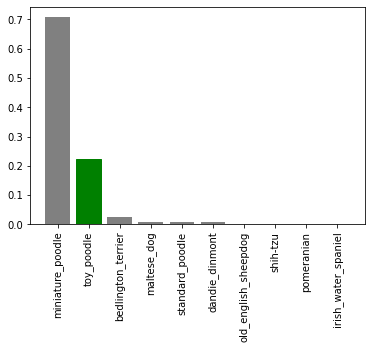

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

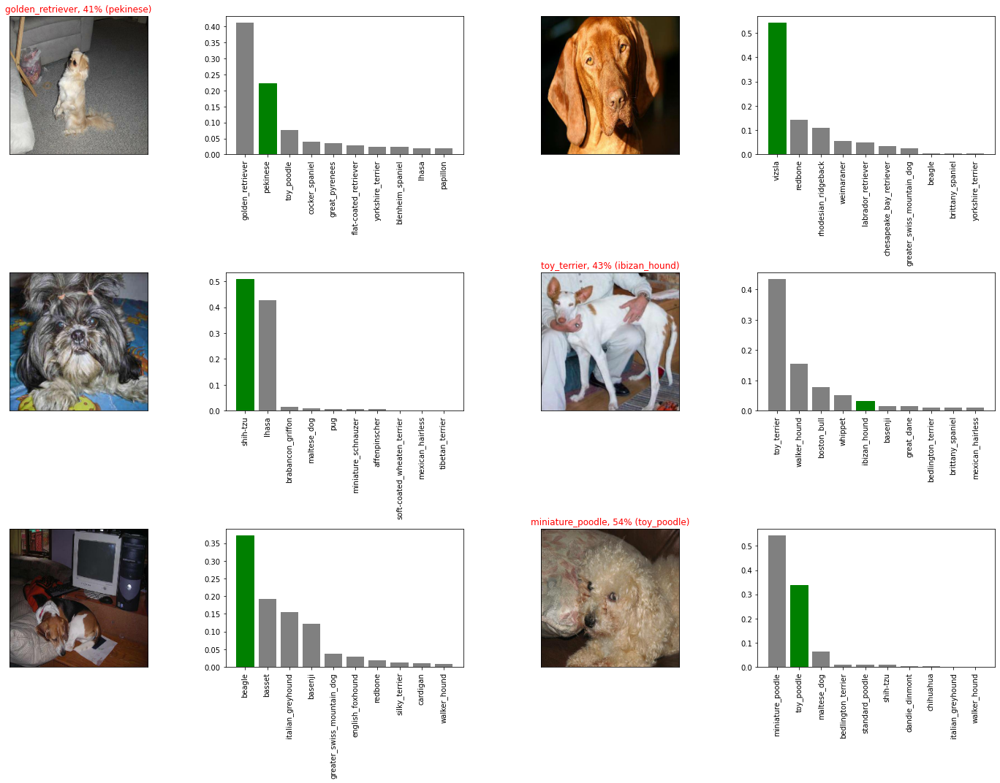

In [ ]:
# Let's check a few predictions and their values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a model

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.

The format of an entire saved Keras model is h5. So we'll make a function which can take a model as input and utilise the save() method to save it as a h5 file to a specified directory

In [ ]:
import os
def save_model(model, suffix=None):
  """
  Saves a given model in a models directoryand appends a suffix (str) for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/My Drive/data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path} ")
  model.save(model_path)
  return model_path  

If we've got a saved model, we'd like to load it, let's create a function which can take a model path and use the 'tf.keras.models.load_model()' function to load it into the notebook.

Because we're using the component from TensorFlow Hub (hub.KerasLayer) we'll have to pass this as a parameter to the custom_objects parameter.

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our trained model on 1000 images
save_model(model, "1000-images-Adam")

Saving model to: /content/drive/My Drive/data/models/20200730-16321596126776-1000-images-Adam.h5 


'/content/drive/My Drive/data/models/20200730-16321596126776-1000-images-Adam.h5'

In [ ]:
# Load our model trained on 1000 images
model_1000_images = load_model("/content/drive/My Drive/data/models/20200728-22131595974419-1000-images-Adam.h5")

Loading saved model: /content/drive/My Drive/data/models/20200728-22131595974419-1000-images-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.3046 - accuracy: 0.6900


[1.304632544517517, 0.6899999976158142]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 112ms/step - loss: 1.2483 - accuracy: 0.6500


[1.2483360767364502, 0.6499999761581421]

## Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to x and all of the training labels to y. Let's check them out.

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# Turning full training data into a data batch
full_data = create_data_batches(x, y)

Creating training data batches...............


In [ ]:
# Instatntiate a new model for training on the full dataset
full_model = create_models()

Building a model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set while training on all the data, therefore can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/data/logs

<IPython.core.display.Javascript object>

In [ ]:
# Fit the full model to the full training data
full_model.fit(x = full_data,
               epochs=NUM_EPOCH,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
  3/320 [..............................] - ETA: 47:34 - loss: 5.5255 - accuracy: 0.0208

KeyboardInterrupt: ignored

In [ ]:
# Save model to file 
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/My Drive/data/models/20200730-16331596126813-full-image-set-mobilenetv2-Adam.h5 


'/content/drive/My Drive/data/models/20200730-16331596126813-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/My Drive/data/models/20200730-13291596115792-full-image-set-mobilenetv2-Adam.h5')

Loading saved model: /content/drive/My Drive/data/models/20200730-13291596115792-full-image-set-mobilenetv2-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get into the same format.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True(since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the predict() function.

In [ ]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
import os
test_path = "drive/My Drive/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/My Drive/data/test/f56b3708592637432ac53d7f0684dfa8.jpg',
 'drive/My Drive/data/test/f575720280425098d6faca42cff69a36.jpg',
 'drive/My Drive/data/test/f56b4140707da82fe91cb9e5df4ce68c.jpg',
 'drive/My Drive/data/test/f574f558d78db4e616e91f5dd5347409.jpg',
 'drive/My Drive/data/test/f5787e3574a4af6a19ff825cf0c32366.jpg',
 'drive/My Drive/data/test/f586cdd98e69c6909b8048d728937ab9.jpg',
 'drive/My Drive/data/test/f57f8ce3fe1d928828e37a9bd78574d9.jpg',
 'drive/My Drive/data/test/f58b1ce36c59e42dd22be92949fc38a7.jpg',
 'drive/My Drive/data/test/f58a21665136bb6aa4aa90c485be4315.jpg',
 'drive/My Drive/data/test/f58ce44146db339a0bba50bcecb02730.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches........


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 4573s 14s/step


### Preparong test dataset predictions on kaggle
Looking at the 'Kaggle sample submission' it looks like they want the models output probabilities each for label along woth the image ID's.

To get the data in the format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [ ]:
# Create pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's tp predictions DataFrame
test_path = "/content/drive/My Drive/data/test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f56b3708592637432ac53d7f0684dfa8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f575720280425098d6faca42cff69a36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f56b4140707da82fe91cb9e5df4ce68c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f574f558d78db4e616e91f5dd5347409,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f5787e3574a4af6a19ff825cf0c32366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f56b3708592637432ac53d7f0684dfa8,9.52842e-07,6.10725e-07,5.24352e-06,1.81574e-07,4.16792e-06,1.24666e-05,6.14111e-07,9.03634e-07,3.00796e-07,1.3997e-05,3.99366e-07,2.58933e-06,8.65966e-07,3.42617e-06,1.29325e-05,1.64077e-06,2.31014e-05,3.5334e-06,1.86955e-05,8.2557e-06,9.65944e-08,4.02304e-06,6.12465e-06,4.93102e-07,3.73154e-06,3.01529e-07,1.4335e-06,3.78882e-05,1.27159e-05,4.21106e-07,2.7763e-06,5.36601e-07,9.12536e-06,0.0002462,4.30068e-07,2.02724e-06,5.77274e-05,0.000333529,9.3827e-05,...,0.000645332,1.99513e-05,4.40654e-06,2.18862e-06,5.71883e-06,2.32665e-07,2.64016e-05,5.74344e-06,1.44299e-05,2.16092e-06,2.198e-06,2.02205e-05,1.19776e-05,1.0264e-05,0.000316603,4.93114e-05,3.04049e-06,6.41467e-05,9.47166e-08,0.000302762,2.91179e-06,0.569481,9.57062e-06,4.74596e-07,6.7206e-06,5.48673e-07,5.06672e-05,3.06554e-07,1.68552e-05,1.57432e-05,3.7951e-07,1.03742e-05,4.99765e-07,1.26046e-06,1.62888e-06,5.67954e-06,9.45159e-06,6.81601e-07,1.75103e-06,2.10743e-07
1,f575720280425098d6faca42cff69a36,2.74794e-06,1.17704e-06,6.44061e-07,5.27012e-05,0.000780093,0.0135406,2.40531e-05,3.17804e-06,4.22744e-07,7.51964e-06,1.74701e-05,2.67625e-05,0.000178686,1.49607e-06,3.83705e-05,0.000473621,4.81713e-06,2.51778e-05,4.3188e-07,7.45813e-06,4.44681e-06,2.86839e-05,0.000434896,3.28498e-07,5.66593e-06,2.94417e-06,6.06503e-07,1.32022e-06,4.71242e-06,2.63449e-05,6.12981e-05,1.20326e-06,1.65033e-05,3.60823e-06,2.1411e-05,1.50281e-06,1.94675e-06,7.56949e-06,0.00531586,...,4.24968e-06,2.10022e-06,8.73672e-07,2.44125e-06,2.12189e-06,4.44702e-06,1.83125e-06,8.07788e-06,7.5319e-06,3.81097e-05,7.22652e-06,0.903156,9.98114e-07,1.59778e-06,1.28656e-06,0.000358331,3.88495e-07,2.08269e-06,2.2163e-06,2.81154e-06,4.58376e-06,2.16925e-05,3.12243e-05,1.0911e-06,0.00013916,5.32355e-06,4.25969e-06,1.95167e-06,7.20748e-05,1.50277e-06,6.59352e-05,4.49484e-05,1.56889e-05,7.1477e-06,1.24676e-05,3.23088e-05,6.17733e-06,1.64041e-06,8.3223e-06,6.381e-05
2,f56b4140707da82fe91cb9e5df4ce68c,2.93786e-06,4.80933e-06,6.14514e-06,3.89343e-05,2.08399e-06,2.83275e-06,8.66498e-07,4.00074e-07,9.46553e-06,4.81794e-07,0.000300123,0.000103106,2.50005e-06,3.33704e-05,1.67451e-06,0.000122623,1.07586e-06,4.17058e-06,7.41157e-05,1.10362e-07,7.43081e-06,6.92212e-07,2.70185e-06,4.94585e-05,0.00022545,3.22926e-05,0.00263579,1.92233e-05,0.000754524,3.87737e-07,0.00193456,0.000831172,0.000172768,8.49272e-06,1.72614e-05,0.000438237,9.00771e-07,4.4951e-06,5.54369e-06,...,3.65851e-05,1.63837e-06,0.0106461,8.31079e-05,0.000116079,2.04086e-05,5.24892e-06,2.73401e-06,1.14638e-05,6.53201e-06,2.42484e-07,1.06276e-05,0.000406728,1.15818e-05,0.000394312,3.10634e-07,6.84589e-06,9.17732e-05,0.000566304,3.76026e-06,0.000412123,2.00116e-05,1.56951e-06,0.00122974,1.44314e-05,0.00597717,2.19336e-07,5.93689e-07,0.0060907,2.10656e-05,0.00038579,1.41894e-07,1.18836e-05,1.82163e-05,1.20346e-05,8.23981e-06,1.14859e-06,7.27134e-

In [ ]:
preds_df.to_csv("drive/My Drive/data/full_submission_1_mobilenetV2_adam.csv",
                index=False)

### Making predictions on custom images
It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same formatthe model was trained on.

To do so we'll:
* Get the filepaths of ouyr own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images,

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/My Drive/data/dogs/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches........


In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

Now we've got some predictions arrays, let's convert them to labels and compare them with each image.

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['dingo', 'golden_retriever', 'toy_poodle']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
 for image in custom_data.unbatch().as_numpy_iterator():
   custom_images.append(image)

IndentationError: ignored

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

NameError: ignored

<Figure size 720x720 with 0 Axes>